---
title: Fig. 5 - Interpreting New Strain Relationships
author: Benjamin Doran
date: today
---

In [63]:
#| code-summary: julia setup
using DrWatson
@quickactivate projectdir()

using SpectralInference
using NewickTree
using HypothesisTests
using MultipleTesting: adjust, Bonferroni, BenjaminiHochberg
using CSV, DataFrames
using StatsBase
using Muon
using Random: shuffle, seed!
using CategoricalArrays: cut, recode!
using LaTeXStrings
using Images

using StatsPlots
theme(:default, grid=false, label=false, tickdir=:out)
include(srcdir("helpers.jl"))

bbdir = datadir("exp_pro", "BB669") |> mkpath;
pdir = plotsdir("strain_variation_tree_and_tests") |> mkpath;
rdir = projectdir("_research", "strain_variation_wilcoxon_tests") |> mkpath

speciescolordf = CSV.read(datadir("exp_raw", "BB669", "subsettreecolors.csv"), DataFrame)
species_color_dict = Dict(k => v for (k, v) in zip(speciescolordf.species_name, speciescolordf.color));

# Fig. S11 - Statistical tests through the spectral tree

Given that we are able to create a spectral tree that respects taxonomic relationships and even captures sub-species groupings that corresponds with host environment, we were interested in understanding what genomic signatures were describing these sub-species groupings. However, because these sub-species groups a specifically defined by these genomic features, assumptions of independence typical to statistical tests are violated. Therefore we use a more stringent test to determine whether a given OGG is differentially abundant by using how likely it is for any of the features we are looking at to be significant before deciding if each individual OGG feature is significant.   

Specifically to determine whether a given OGG is differentially abundant in a statistically significant way across two groups (‘group A’ and ‘group B’) that arise from a common node in the Spectral Tree, we first generate a ‘reference p-value’ and a ‘null distribution’. The reference p-value signifies the difference in $OGG_i$ across the two groups (Wilcoxon test). To generate a null distribution of p-values, we create 100 permutations of the distributions between groups A and B that randomly shuffles entries in the two groups. For all OGGs within the Spectral Tree, we compute a distribution of the most significant p-values across all permutations. The Q-value for a given OGG is computed as the number of p-values in the null distribution that are less than the reference p-value ($P$) relative to the total number of p-values in the null distribution (equation).

$$Q = \frac{N_{p_{perm}} < N_{p_{ref}}}{N_{p_{perm}}}$$

## Filtering to species that have > 20 strain replicates

In [2]:
uniprot = readh5ad(datadir("exp_raw", "UP7047", "2020_02_UP7047.h5ad"))
biobank = readh5mu(datadir("exp_raw", "BB669", "BB669.h5mu"))

┌ Warning: Cannot join columns with the same name because var_names are intersecting.
└ @ Muon /Users/bend/.julia/packages/Muon/UKjAF/src/mudata.jl:367


MuData object 669 ✕ 21475
└ metabolites_foldchange
  AnnData object 669 ✕ 50
└ oggs
  AnnData object 669 ✕ 11248
└ UPorder_oggs
  AnnData object 669 ✕ 10177

In [3]:
upmtx = uniprot.X[:, :]
upusv = svd(upmtx)
bbmtx = biobank["UPorder_oggs"].X[:,:]
size(bbmtx)

(669, 10177)

In [4]:
keptspecies = sort(filter(x-> last(x) >= 20, countmap(biobank.obs.Species)), byvalue=true, rev=true)
filter!(!=("unclassified"), keptspecies)
# species => number of strains belonging to that species

OrderedCollections.OrderedDict{String, Int64} with 12 entries:
  "Phocaeicola vulgatus"         => 88
  "[Ruminococcus] gnavus"        => 41
  "Bacteroides thetaiotaomicron" => 35
  "Anaerostipes hadrus"          => 31
  "Bacteroides uniformis"        => 27
  "unclassified"                 => 26
  "Blautia luti"                 => 24
  "Bifidobacterium breve"        => 24
  "Coprococcus comes"            => 23
  "Dorea formicigenerans"        => 22
  "Blautia wexlerae"             => 21
  "[Eubacterium] rectale"        => 20

I had previously calculated which strains belonged to these species when I saved the biobank dataset

In [5]:
strvarmtx = bbmtx[biobank.obs.kept_species.==1,:];
@show size(strvarmtx)

strvarobs = biobank.obs[biobank.obs.kept_species.==1, :]
strvar_obsnames = strvarobs.Strain_ID

# infer hierarchical relationships of just the species with
# greater than 20 strain replicates
uhat = projectinLSV(strvarmtx, upusv)
dij = spectraldistances(uhat, upusv.S; alpha=1.5, q=.75) ./ size(uniprot, 2)
strvartree_hc = UPGMA_tree(dij)
strvartree = readnw(SpectralInference.newickstring(strvartree_hc, strvar_obsnames))
# ladderize!(strvartree)

## write out tree
open(joinpath(bbdir, "strvar-spitree.nw"), "w") do io
    writenw(io, strvartree)
end

size(strvarmtx) = (356, 10177)


12058

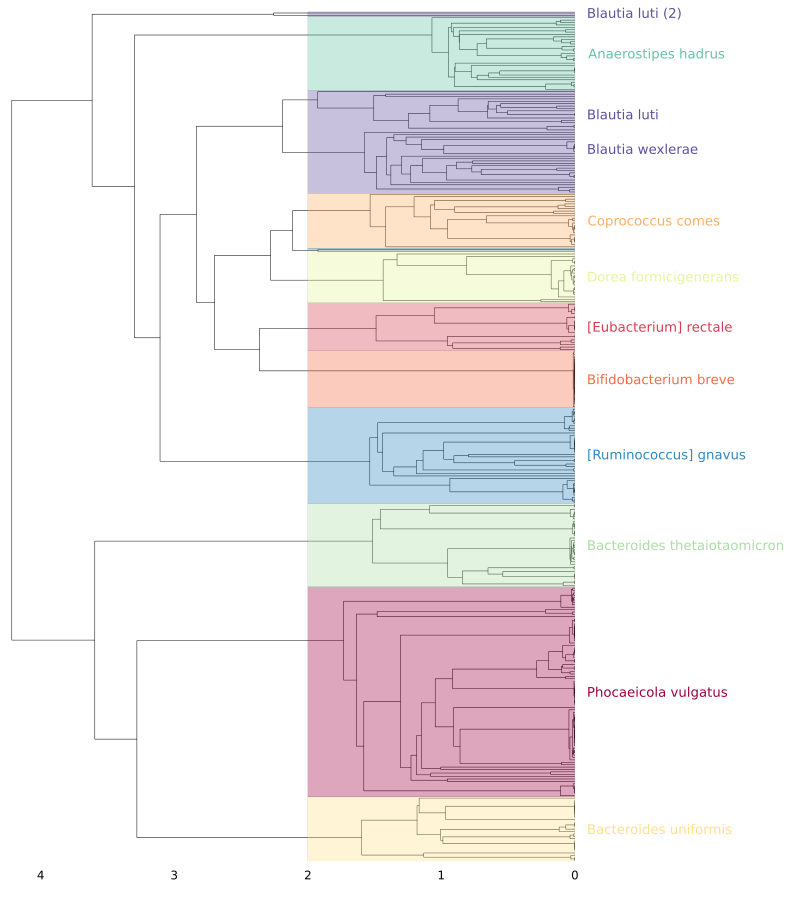

In [64]:
# plot cladogram
strvartree_hc = UPGMA_tree(dij)
subsettreestring = SpectralInference.newickstring(strvartree_hc, strvarobs.Strain_ID)
subsettree = readnw(subsettreestring);
plot(strvartree_hc, 
    size=(800, 900),
    lw=.5,
    yflip=true, 
    xmirror=true,
    xticks=:none,
    permute=(:y, :x),
    grid=false,
    tickdirection=:none,
    rightmargin=5.5Plots.cm, 
    label="",
    framestyle=:grid,
)

# plot annotation rectangles
rectangle(w, h, x, y) = Shape(x .+ [0,w,w,0], y .+ [0,0,h,h])
speciesvector = strvarobs.Species[strvartree_hc.order]
breaks = findall(speciesvector[begin:(end-1)] .!= speciesvector[2:end])[Not([10, 11, 12, 13, 14,15])]
edges = [(s, e) for (s,e) in zip(vcat([0],breaks), vcat(breaks, [length(speciesvector)]))];
rects = [rectangle(2,(e-s),0,s+.5) for (s,e) in zip(vcat([0],breaks), vcat(breaks, [length(speciesvector)]))];
rectspeciescolors = permutedims(speciescolordf.color[indexin(speciesvector[first.(edges).+1], speciescolordf.species_name)]);
fancy_treeplot = plot!(permutedims(rects), fill=0.35, lw=0, c=rectspeciescolors, label="")

# species 
for (i, (k,v)) in enumerate(zip(speciescolordf.species_name, speciescolordf.color))
    yval = median(findall(==(k), speciesvector))
    annotate!(-0.1, yval, text(k, 9, :left, v))
end
annotate!(-0.1, 356, text("Blautia luti (2)", 9, :left, species_color_dict["Blautia luti"]))

fancy_treeplot

## Statistically test clades at each node in tree

In [7]:
# functions to compare differences
function cliffs_d(a, b) 
    ans = 0.
    for i in a, j in b
        ans += sign(i - j)
    end
    ans / (length(a) * length(b))
end

function log2FC(a, b) 
    mean(log2.(a .+ 1)) - mean(log2.(b .+ 1))
end

log2FC (generic function with 1 method)

In [8]:
#| code-fold: false
#| code-summary: significance tests across full strain variation tree
# significance tests across full strain variation tree
seed!(123456789)
tree = strvartree

maxtreeheight = last(maximum(getheights(tree)))
leaves = getleaves(tree)
leafnames = name.(leaves);
treeorder = indexin(leafnames, strvar_obsnames);

ogg_mtx = biobank["oggs"].X[:,:][biobank.obs.kept_species.==1,:]
ogg_mask = vec(mapslices(c->std(c) > 0, ogg_mtx, dims=1))
ogg_mtx = ogg_mtx[treeorder, ogg_mask]
@show size(ogg_mtx)
ogg_names = biobank["oggs"].var_names[ogg_mask]

ogg_freqs = vec(mean(ogg_mtx .> 0, dims=1))

taxon_info = strvarobs[treeorder, :]
taxon_info.species_donor = join.(eachrow(strvarobs[treeorder, [:Species, :Donor]]), " ")


isolate_ids = getleafnames(tree)
testresults = DataFrame()


for node in prewalk(tree)
    #  if group size would be less than 1 skip node
    (isleaf(node) || any(isleaf.(node.children))) && continue
    
    # find comparison groups
    grp1_idx = indexin(getleafnames(node.children[1]), isolate_ids)
    grp2_idx = indexin(getleafnames(node.children[2]), isolate_ids)
    
    pvals = mapslices(ogg_mtx, dims=1) do column
        pvalue(MannWhitneyUTest(column[grp1_idx], column[grp2_idx]))
    end |> vec
    
    # make null
    seed!(1234)
    null_qs = map(1:100) do i
        n = length(grp1_idx)
        m = length(grp2_idx)
        perm_idx = shuffle(vcat(grp1_idx, grp2_idx))
        qs = mapslices(ogg_mtx, dims=1) do column_perm
            q = pvalue(MannWhitneyUTest(column_perm[perm_idx[1:n]], column_perm[perm_idx[n+1:end]]))
        end
        minimum(qs)
    end

    qvals = mapslices(ogg_mtx, dims=1) do column
        pval = pvalue(MannWhitneyUTest(column[grp1_idx], column[grp2_idx]))
        mean(null_qs .< pval)
    end |> vec
    
    effects = mapslices(ogg_mtx, dims=1) do column
        abs(mean(column[grp1_idx]) - mean(column[grp2_idx]) / std(column))
    end |> vec

    log_effects = mapslices(ogg_mtx, dims=1) do column
        logcol = log2.(column.+1)
        abs(mean(logcol[grp1_idx]) - mean(logcol[grp2_idx]) / std(logcol))
    end |> vec
    
    log2FCs = mapslices(ogg_mtx, dims=1) do column
        log2FC(column[grp1_idx], column[grp2_idx])
    end |> vec

    cliffs_ds = mapslices(ogg_mtx, dims=1) do column
        cliffs_d(column[grp1_idx], column[grp2_idx])
    end |> vec

    grp1_prp_exp = mapslices(ogg_mtx, dims=1) do column
        mean(column[grp1_idx] .> 0)
    end |> vec

    grp2_prp_exp = mapslices(ogg_mtx, dims=1) do column
        mean(column[grp2_idx] .> 0)
    end |> vec
    
    testresults = vcat(testresults, 
        DataFrame(
            :nodeids => id(node),
            :nodeheight =>  NewickTree.height(node),
            :nodedepth =>  maxtreeheight - NewickTree.height(node),
            :grp1_N => length(grp1_idx),
            :grp2_N => length(grp2_idx),
            :grp1_phylum_mode => mode(taxon_info.Phylum[grp1_idx]),
            :grp2_phylum_mode => mode(taxon_info.Phylum[grp2_idx]),
            :grp1_species_mode => mode(taxon_info.Species[grp1_idx]),
            :grp2_species_mode => mode(taxon_info.Species[grp2_idx]),
            :grp1_species_donor_mode => mode(taxon_info.species_donor[grp1_idx]),
            :grp2_species_donor_mode => mode(taxon_info.species_donor[grp2_idx]),
            :ogg_name => ogg_names,
            :ogg_idx => collect(axes(ogg_mtx, 2)),
            :ogg_freqs => ogg_freqs,
            :grp1_prp_exp => grp1_prp_exp,
            :grp2_prp_exp => grp2_prp_exp,
            :effectsize => effects,
            :logeffectsize => log_effects,
            :log2FC => log2FCs,
            :cliffs_d => cliffs_ds,
            :pvals => pvals,
            :qvals => qvals,
        )
    )
end
testresults[!, "pval_BH"] .= adjust(testresults.pvals, BenjaminiHochberg());
testresults[!, "pval_Bon"] .= adjust(testresults.pvals, Bonferroni());
testresults[!, "qval_BH"] .= adjust(testresults.qvals, BenjaminiHochberg());

tree_discretization = cut(testresults.nodedepth, [0, 2, 4, 5])
recode!(tree_discretization, 
    "[4, 5)"=>"phylum level", 
    "[2, 4)"=>"species level",
    "[0, 2)"=>"strain level")
testresults[!, "tree_level"] = tree_discretization
testresults;

size(ogg_mtx) = (356, 5449)


In [9]:
countmap(testresults.tree_level)

Dict{CategoricalArrays.CategoricalValue{String, UInt32}, Int64} with 3 entries:
  "species level" => 59939
  "strain level"  => 457716
  "phylum level"  => 5449

In [10]:
CSV.write(joinpath(rdir, "full_ogg_wilcoxon_testresults_on_big10species.csv"), testresults)
testresults |> 
    df->filter(:pval_BH => <(0.05), df) |>
    df->CSV.write(joinpath(rdir, "significant_BH_ogg_wilcoxon_testresults_on_big10species.csv"), df)
testresults |>
    df->filter(:pval_Bon => <(0.05), df) |>
    df->CSV.write(joinpath(rdir, "significant_Bon_ogg_wilcoxon_testresults_on_big10species.csv"), df)
testresults |>
    df->filter(:qval_BH => <(0.05), df) |>
    df->CSV.write(joinpath(rdir, "significant_Qbh_ogg_wilcoxon_testresults_on_big10species.csv"), df)

"/Users/bend/projects/Doran_etal_2023/_research/strain_variation_wilcoxon_tests/significant_Qbh_ogg_wilcoxon_testresults_on_big10species.csv"

## Filtering to most significant results

In [11]:
testresults = CSV.read(joinpath(rdir, "full_ogg_wilcoxon_testresults_on_big10species.csv"), DataFrame);

In [12]:
sigtestresults = filter(:qval_BH => <(0.05), testresults) |>
    df -> filter(:logeffectsize => >(1), df) |>
    df -> filter(:effectsize => >(1), df) |>
    df -> filter(:log2FC => x->abs.(x) .> 1 , df);

In [13]:
@show sigtestresults.ogg_name |> unique |> length
@show sigtestresults.nodeids |> unique |> length
@show sum(sigtestresults.tree_level .== "phylum level")
@show sum(sigtestresults.tree_level .== "species level")
@show sum(sigtestresults.tree_level .== "strain level");

(sigtestresults.ogg_name |> unique) |> length = 1530
(sigtestresults.nodeids |> unique) |> length = 66
sum(sigtestresults.tree_level .== "phylum level") = 415
sum(sigtestresults.tree_level .== "species level") = 1117
sum(sigtestresults.tree_level .== "strain level") = 1070


In [14]:
# how many OGGs are still duplicated?
sigtestresults |> 
    df -> groupby(df, :ogg_name) |>
    df -> subset(df, :log2FC => x -> abs.(x) .== maximum(abs.(x))) |>
    df -> countmap(df.ogg_name) |>
    cm -> sum(values(cm) .> 1)

27

In [15]:
# for these remaining OGGs select the shallowest significant example
uniqueOGGresults = sigtestresults |> 
    df -> groupby(df, :ogg_name) |>
    df -> subset(df, :log2FC => x -> abs.(x) .== maximum(abs.(x))) |>
    df -> groupby(df, :ogg_name) |>
    df -> subset(df, :nodeheight => x -> x .== minimum(x));
@show nrow(uniqueOGGresults) == length(unique(uniqueOGGresults.ogg_name))
@show sum(uniqueOGGresults.tree_level .== "phylum level")
@show sum(uniqueOGGresults.tree_level .== "species level")
@show sum(uniqueOGGresults.tree_level .== "strain level");

nrow(uniqueOGGresults) == length(unique(uniqueOGGresults.ogg_name)) = true
sum(uniqueOGGresults.tree_level .== "phylum level") = 273
sum(uniqueOGGresults.tree_level .== "species level") = 676
sum(uniqueOGGresults.tree_level .== "strain level") = 581


In [16]:
CSV.write(joinpath(rdir, "unique_sig_ogg_wilcoxon_testresults_on_big10species.csv"), uniqueOGGresults)

"/Users/bend/projects/Doran_etal_2023/_research/strain_variation_wilcoxon_tests/unique_sig_ogg_wilcoxon_testresults_on_big10species.csv"

Phylum level significant orthologs

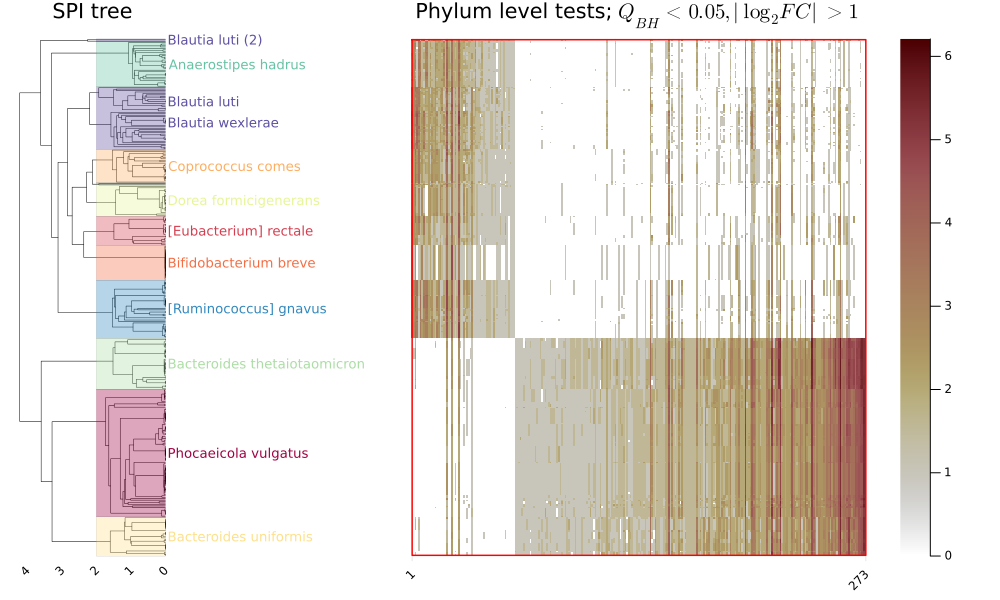

In [65]:
ogg_plotting_order = uniqueOGGresults |>
    df->subset(df,  :tree_level => x-> x.==("phylum level"), :grp1_N => x-> x.>=3, :grp2_N => x-> x.>=3) |>
    df->subset(df, :nodeids => (x->get.(Ref(countmap(x)), x, 0) .> 10)) |>
    df->sort(df, [:nodeids, :log2FC]);

hmapplot = heatmap(log2.(ogg_mtx[:, ogg_plotting_order.ogg_idx] .+ 1), 
# hmapplot = heatmap(log2.(ogg_mtx[:, uniqueOGGresults.ogg_idx]),
    title="Phylum level tests; " * L"Q_{BH} < 0.05, |\log_2 FC| > 1",
    yticks=false,
    # xticks=(1:nrow(uniqueOGGresults), uniqueOGGresults.ogg_name),
    xticks=[1, findall(diff(ogg_plotting_order.nodeids) .!= 0)..., nrow(ogg_plotting_order)],
    xrotation=45,
    ylims=(.5,356.5),
    framestyle=:grid,
    cticks=(1:4, string.(2 .^ 1:4)),
    c=cgrad(:bilbao, rev=true),
    leftmargin=0Plots.mm,
);

rectangle(w, h, x, y) = Shape(x .+ [0,w,w,0], y .+ [0,0,h,h])
leafnames = getleafnames(strvartree)
oggrects = map(unique(ogg_plotting_order.nodeids)) do nid
    node = filter(x-> id(x)==(nid), prewalk(strvartree))[1]
    idx_taxa = indexin(getleafnames(node), leafnames)
    noderesults = filter(:nodeids => ==(nid), ogg_plotting_order)
    idx_oggs = indexin(noderesults.ogg_name, ogg_plotting_order.ogg_name)
    x = minimum(idx_oggs)
    y = minimum(idx_taxa)
    width = maximum(idx_oggs) - minimum(idx_oggs)
    height = maximum(idx_taxa) - minimum(idx_taxa)
    rectangle(width, height, x, y)
end

plot!(permutedims(oggrects), fill=0.0, lw=1.5, linecolor="red", label="")

layout = @layout [a{.2w} b]
plot(plot(fancy_treeplot, title="SPI tree"), hmapplot; layout, xrotation=45, size=(1000,600), link=:y, legend=:none, margin=3Plots.Measures.mm)

In [66]:
savefig(joinpath(pdir, "significantOGGS_pernode_phylumlevel_treeandheatmap_coloredboxes.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/strain_variation_tree_and_tests/significantOGGS_pernode_phylumlevel_treeandheatmap_coloredboxes.pdf"

Species level significant orthologs

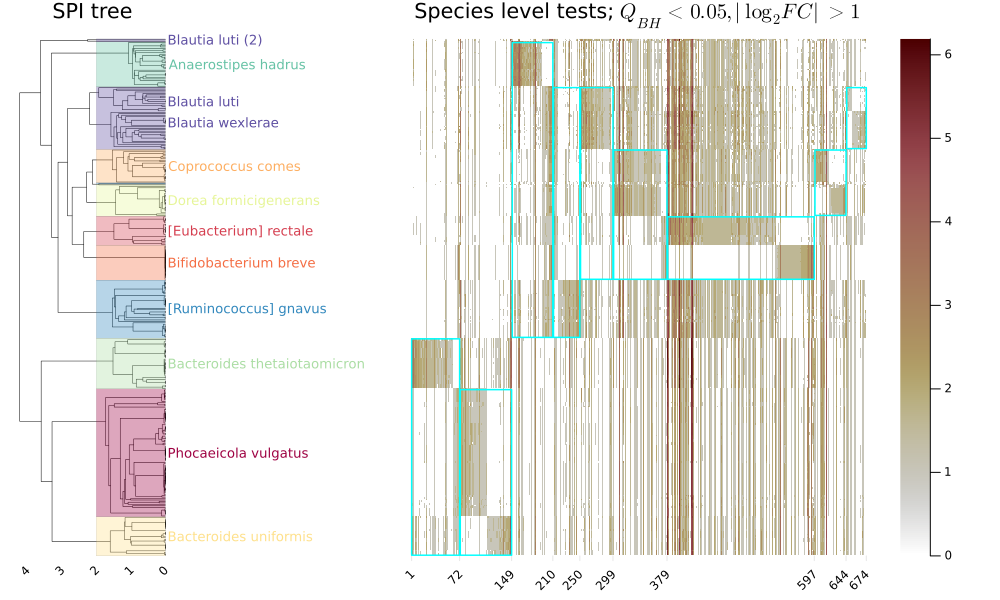

In [67]:
ogg_plotting_order = uniqueOGGresults |>
    df->subset(df,  :tree_level => x-> x.==("species level"), :grp1_N => x-> x.>=3, :grp2_N => x-> x.>=3) |>
    df->subset(df, :nodeids => (x->get.(Ref(countmap(x)), x, 0) .> 10)) |>
    df->sort(df, [:nodeids, :log2FC]);

hmapplot = heatmap(log2.(ogg_mtx[:, ogg_plotting_order.ogg_idx] .+ 1), 
# hmapplot = heatmap(log2.(ogg_mtx[:, uniqueOGGresults.ogg_idx]),
    title="Species level tests; " * L"Q_{BH} < 0.05, |\log_2 FC| > 1",
    yticks=false,
    # xticks=(1:nrow(uniqueOGGresults), uniqueOGGresults.ogg_name),
    xticks=[1, findall(diff(ogg_plotting_order.nodeids) .!= 0)..., nrow(ogg_plotting_order)],
    xrotation=45,
    ylims=(.5,356.5),
    framestyle=:grid,
    cticks=(1:4, string.(2 .^ 1:4)),
    c=cgrad(:bilbao, rev=true),
    leftmargin=0Plots.mm,
);

rectangle(w, h, x, y) = Shape(x .+ [0,w,w,0], y .+ [0,0,h,h])
leafnames = getleafnames(strvartree)
oggrects = map(unique(ogg_plotting_order.nodeids)) do nid
    node = filter(x-> id(x)==(nid), prewalk(strvartree))[1]
    idx_taxa = indexin(getleafnames(node), leafnames)
    noderesults = filter(:nodeids => ==(nid), ogg_plotting_order)
    idx_oggs = indexin(noderesults.ogg_name, ogg_plotting_order.ogg_name)
    x = minimum(idx_oggs)
    y = minimum(idx_taxa)
    width = maximum(idx_oggs) - minimum(idx_oggs)
    height = maximum(idx_taxa) - minimum(idx_taxa)
    rectangle(width, height, x, y)
end

plot!(permutedims(oggrects), fill=0.0, lw=1.5, linecolor="aqua", label="")

layout = @layout [a{.2w} b]
plot(plot(fancy_treeplot, title="SPI tree"), hmapplot; layout, xrotation=45, size=(1000,600), link=:y, legend=:none, margin=3Plots.Measures.mm)

In [68]:
savefig(joinpath(pdir, "significantOGGS_pernode_specieslevel_treeandheatmap_coloredboxes.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/strain_variation_tree_and_tests/significantOGGS_pernode_specieslevel_treeandheatmap_coloredboxes.pdf"

 Strain level significant orthologs

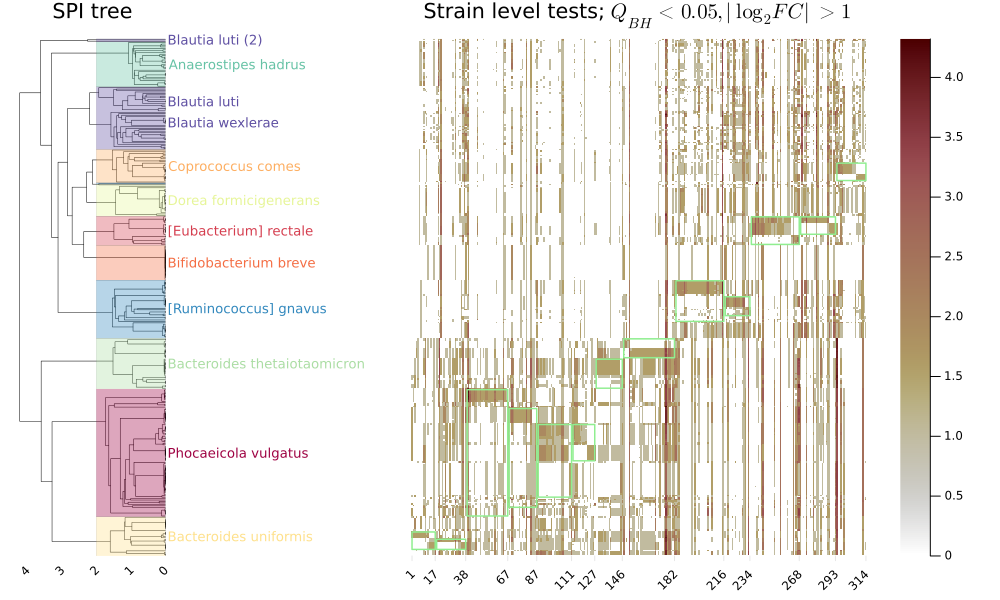

In [69]:
ogg_plotting_order = uniqueOGGresults |>
    df->subset(df,  :tree_level => x-> x.==("strain level"), :grp1_N => x-> x.>=3, :grp2_N => x-> x.>=3) |>
    df->subset(df, :nodeids => (x->get.(Ref(countmap(x)), x, 0) .> 10)) |>
    df->sort(df, [:nodeids, :log2FC]);

hmapplot = heatmap(log2.(ogg_mtx[:, ogg_plotting_order.ogg_idx] .+ 1), 
# hmapplot = heatmap(log2.(ogg_mtx[:, uniqueOGGresults.ogg_idx]),
    title="Strain level tests; " * L"Q_{BH} < 0.05, |\log_2 FC| > 1",
    yticks=false,
    # xticks=(1:nrow(uniqueOGGresults), uniqueOGGresults.ogg_name),
    xticks=[1, findall(diff(ogg_plotting_order.nodeids) .!= 0)..., nrow(ogg_plotting_order)],
    xrotation=45,
    ylims=(.5,356.5),
    framestyle=:grid,
    cticks=(1:4, string.(2 .^ 1:4)),
    c=cgrad(:bilbao, rev=true),
    leftmargin=0Plots.mm,
);

rectangle(w, h, x, y) = Shape(x .+ [0,w,w,0], y .+ [0,0,h,h])
leafnames = getleafnames(strvartree)
oggrects = map(unique(ogg_plotting_order.nodeids)) do nid
    node = filter(x-> id(x)==(nid), prewalk(strvartree))[1]
    idx_taxa = indexin(getleafnames(node), leafnames)
    noderesults = filter(:nodeids => ==(nid), ogg_plotting_order)
    idx_oggs = indexin(noderesults.ogg_name, ogg_plotting_order.ogg_name)
    x = minimum(idx_oggs)
    y = minimum(idx_taxa)
    width = maximum(idx_oggs) - minimum(idx_oggs)
    height = maximum(idx_taxa) - minimum(idx_taxa)
    rectangle(width, height, x, y)
end

plot!(permutedims(oggrects), fill=0.0, lw=1.5, linecolor="lightgreen", label="")
# vline!(findall(diff(ogg_plotting_order.nodeids) .> 0) .- .5, lw=1, c=:black, label="")

layout = @layout [a{.2w} b]
plot(plot(fancy_treeplot, title="SPI tree"), hmapplot; layout, xrotation=45, size=(1000,600), link=:y, legend=:none, margin=3Plots.Measures.mm)

In [70]:
savefig(joinpath(pdir, "significantOGGS_pernode_strainlevel_treeandheatmap_coloredboxes.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/strain_variation_tree_and_tests/significantOGGS_pernode_strainlevel_treeandheatmap_coloredboxes.pdf"

zoom-ins of strain level significant orthologs

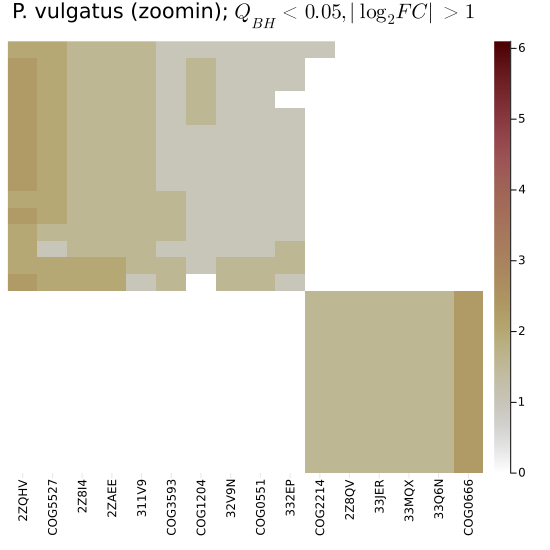

In [71]:
### Strain level zoomin P. vulgatus
ogg_plotting_order.nodeids |> unique
ogg_plotting_order = uniqueOGGresults |>
    df->subset(df,  :tree_level => x-> x.==("strain level"), :grp1_N => x-> x.>=3, :grp2_N => x-> x.>=3) |>
    df->subset(df, :nodeids => (x->get.(Ref(countmap(x)), x, 0) .> 10)) |>
    df->sort(df, [:nodeids, :log2FC]) |>
    df->filter(:nodeids => ==(136), df)
nid = 136
node = filter(x-> id(x)==(nid), prewalk(strvartree))[1]
idx_taxa = indexin(getleafnames(node), leafnames)

hmapplot = heatmap(log2.(ogg_mtx[idx_taxa, ogg_plotting_order.ogg_idx] .+ 1), 
# hmapplot = heatmap(log2.(ogg_mtx[:, uniqueOGGresults.ogg_idx]),
    title="P. vulgatus (zoomin); " * L"Q_{BH} < 0.05, |\log_2 FC| > 1",
    yticks=false,
    xticks=(1:nrow(ogg_plotting_order), ogg_plotting_order.ogg_name),
    # xtickfontsize=1,
    xrotation=90,
    # ylims=(.5,356.5),
    tickdirection=:out,
    framestyle=:grid,
    cticks=(1:4, string.(2 .^ 1:4)),
    clims=(0, 6.1),
    c=cgrad(:bilbao, rev=true),
    size=(550,550),
    leftmargin=0Plots.mm,
    grid=false
)

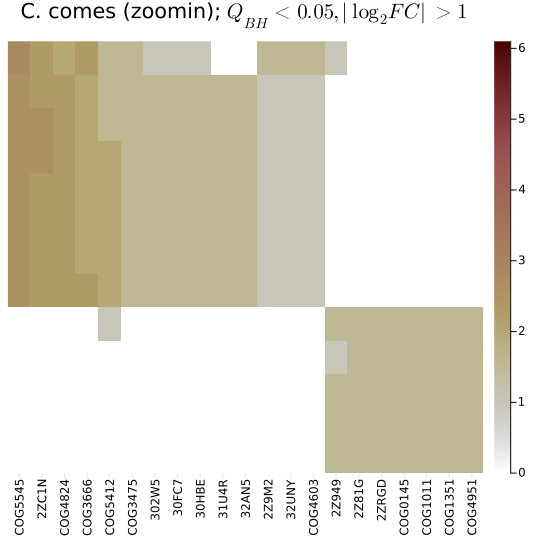

In [72]:
### Strain level zoomin C. comes
ogg_plotting_order.nodeids |> unique
ogg_plotting_order = uniqueOGGresults |>
    df->subset(df,  :tree_level => x-> x.==("strain level"), :grp1_N => x-> x.>=3, :grp2_N => x-> x.>=3) |>
    df->subset(df, :nodeids => (x->get.(Ref(countmap(x)), x, 0) .> 10)) |>
    df->sort(df, [:nodeids, :log2FC]) |>
    df->filter(:nodeids => ==(523), df)
nid = 523
node = filter(x-> id(x)==(nid), prewalk(strvartree))[1]
idx_taxa = indexin(getleafnames(node), leafnames)

hmapplot = heatmap(log2.(ogg_mtx[idx_taxa, ogg_plotting_order.ogg_idx] .+ 1), 
    title="C. comes (zoomin); " * L"Q_{BH} < 0.05, |\log_2 FC| > 1",
    yticks=false,
    xticks=(1:nrow(ogg_plotting_order), ogg_plotting_order.ogg_name),
    xrotation=90,
    tickdirection=:out,
    framestyle=:grid,
    cticks=(1:4, string.(2 .^ 1:4)),
    clims=(0, 6.1),
    c=cgrad(:bilbao, rev=true),
    size=(550,550),
    leftmargin=0Plots.mm,
    grid=false
)

# Main - Explore differences within E. rectale

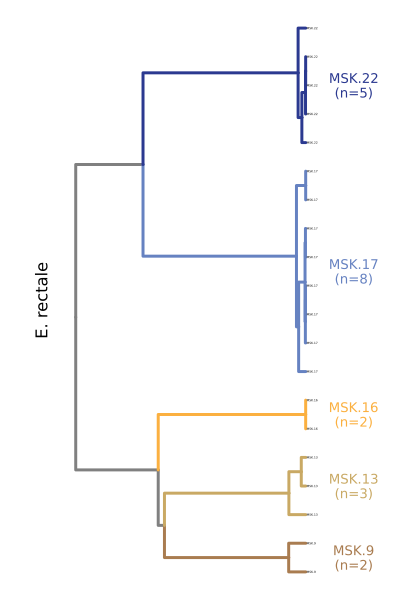

In [25]:
targetid = "MSK.16.22"
strvar_leaves = getleaves(strvartree)
basenode = strvar_leaves[findfirst(n->name(n) == targetid, strvar_leaves)]
subtree = readnw(nwstr(nthparent(basenode, 3)))
rectale_idxs = indexin(getleafnames(subtree),strvarobs.Strain_ID)


tiplabels = strvarobs.Donor[rectale_idxs]
idmapping = Dict(k=>v for (k,v) in zip(getleafnames(subtree), tiplabels))
rename_treeleaves!(subtree, idmapping)

rectale_donor_dict = Dict(
    "MSK.22"=>"#2B3990", 
    "MSK.17"=>"#6682C1", 
    "MSK.16"=>"#FBB040", 
    "MSK.13"=>"#c9a964", 
    "MSK.9"=>"#A97C50",
)

rectale_linecolors = map(prewalk(subtree)) do node; rectale_donor_dict
    if length(unique(getleafnames(node))) == 1
        get(rectale_donor_dict, mode(getleafnames(node)), :grey)
    else
        :grey
    end
end |> x->x[2:end] |> permutedims

plot(subtree,
    c=rectale_linecolors,
    # alpha=.5,
    lw=3, fs=2,
    size=(400,600),
    rightmargin=2Plots.cm,
    leftmargin=10Plots.mm,
    ylabel="E. rectale",
    framestyle=:grid,
    ticks=false,
)
# donor annotations 
for (i, (k,v)) in enumerate(rectale_donor_dict)
    yvals = findall(==(k), getleafnames(subtree))
    yval = median(yvals)
    annotate!(1.8, yval, text("$k\n(n=$(length(yvals)))", 9, :center, v))
end
p1 = plot!()

In [26]:
ogg_plotting_order = uniqueOGGresults |>
    # select test at root of rectale sub tree
    df->subset(df, :nodeids => x-> x.==(id(nthparent(basenode, 3)))) |>
    df->select(df, [:nodeids, :log2FC, :grp1_N, :grp2_N, :ogg_name, :ogg_idx]) |>
    # add in descriptions of each ogg
    df->leftjoin(df, uniprot.var[:, [:og, :description]], on = :ogg_name => :og) |>
    # sort oggs based on abundence per group
    df->sort(df, [:nodeids, :log2FC]) |>
    # get shorter descriptions for lables
    df->coalesce.(df, "") |>
    df->transform(df, 
        :description => ByRow(x->first(replace.(x, r"\(.*\)"=>""), 75)) => :ogg_labels
    );

In [27]:
# more abundant in MSK.17 and MSK.22
subset(ogg_plotting_order,
    :log2FC => ByRow(<(0)),
    :description => ByRow(!=(""))
)

Row,nodeids,log2FC,grp1_N,grp2_N,ogg_name,ogg_idx,description,ogg_labels
,Int64,Float64,Int64,Int64,String15,Int64,String,String
1,433,-2.52345,7,13,COG1345,3757,"Required for morphogenesis and for the elongation of the flagellar filament by facilitating polymerization of the flagellin monomers at the tip of growing filament. Forms a capping structure, which prevents flagellin subunits (transported through the central channel of the flagellum) from leaking out without polymerization at the distal end",Required for morphogenesis and for the elongation of the flagellar filament
2,433,-2.26897,7,13,COG1344,3756,bacterial-type flagellum-dependent cell motility,bacterial-type flagellum-dependent cell motility
3,433,-2.03848,7,13,COG5444,5401,nuclease activity,nuclease activity
4,433,-2.03047,7,13,COG5001,5338,cyclic-guanylate-specific phosphodiesterase activity,cyclic-guanylate-specific phosphodiesterase activity
5,433,-2.0,7,13,COG3210,4625,"domain, Protein","domain, Protein"
6,433,-1.94674,7,13,COG3547,4769,Transposase (IS116 IS110 IS902 family),Transposase
7,433,-1.8723,7,13,COG4495,5124,Domain of unknown function (DUF4176),Domain of unknown function
8,433,-1.74526,7,13,COG1442,3821,lipopolysaccharide 3-alpha-galactosyltransferase activity,lipopolysaccharide 3-alpha-galactosyltransferase activity
9,433,-1.58496,7,13,COG4786,5238,Flagellar basal body rod,Flagellar basal body rod


In [28]:
# more abundant in MSK.9, MSK.13, and MSK.16
subset(ogg_plotting_order,
    :log2FC => ByRow(>(0)),
    :description => ByRow(!=(""))
)

Row,nodeids,log2FC,grp1_N,grp2_N,ogg_name,ogg_idx,description,ogg_labels
,Int64,Float64,Int64,Int64,String15,Int64,String,String
1,433,1.16713,7,13,COG5015,5347,Pyridoxamine 5'-phosphate oxidase,Pyridoxamine 5'-phosphate oxidase
2,433,1.32193,7,13,COG3534,4763,alpha-L-arabinofuranosidase,alpha-L-arabinofuranosidase
3,433,1.64425,7,13,COG3378,4691,Phage plasmid primase P4 family,Phage plasmid primase P4 family
4,433,1.92997,7,13,COG0286,2997,site-specific DNA-methyltransferase (adenine-specific) activity,site-specific DNA-methyltransferase activity
5,433,2.99151,7,13,COG0732,3379,type I restriction modification DNA specificity domain,type I restriction modification DNA specificity domain


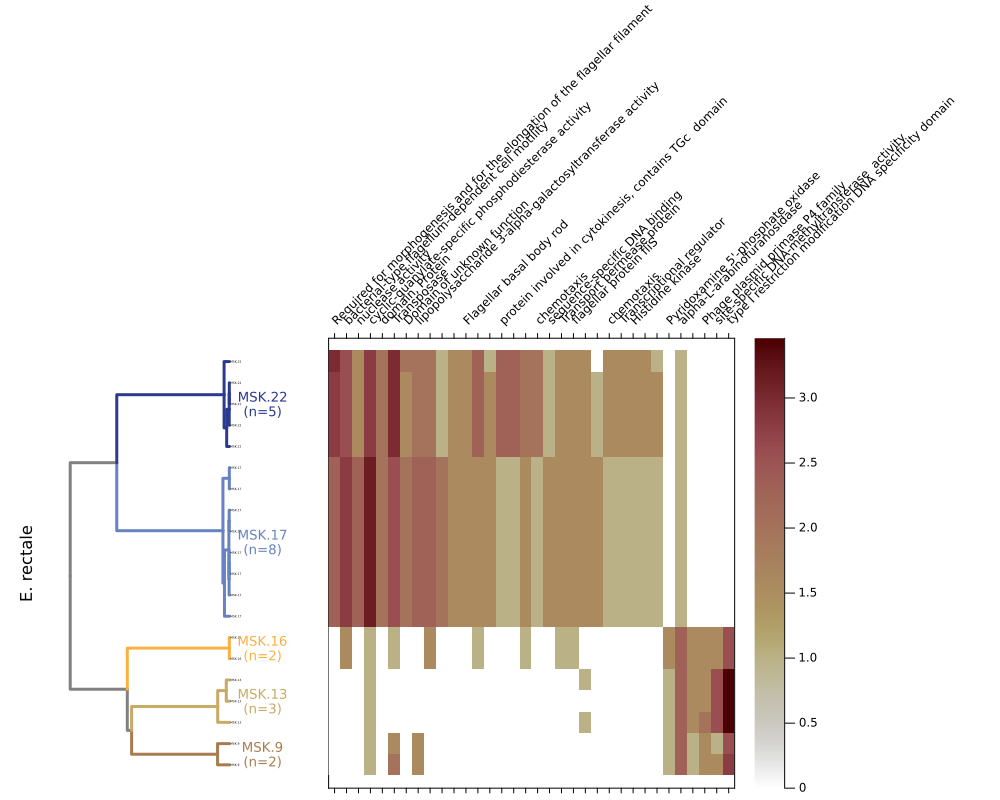

In [29]:
pltmtx = ogg_mtx[indexin(strvarobs.Strain_ID, getleafnames(strvartree)), ogg_plotting_order.ogg_idx][rectale_idxs, :]
p2 = heatmap(log2.(pltmtx .+ 1), 
    yticks=false,
    xticks=(1:nrow(ogg_plotting_order), ogg_plotting_order.ogg_labels),
    tickdirection=:out,
    cticks=(1:4, string.(2 .^ 1:4)),
    c=cgrad(:bilbao, rev=true),
    leftmargin=0Plots.mm,
    rightmargin=4Plots.cm,
    topmargin=1.5Plots.cm,
    grid=false,
    framestyle=:box,
    xmirror=true,
    xrotation=45,
);

plot(p1, p2, layout=@layout([a{.25w} b]), link=:y, size=(1000, 800))

## Validation experiment

We noted that groups of strains from donors 22 and 17 had many orthologs related to the flagellum, that were absent from donors 9, 13, and 16. Conversely donors 9, 13, and 16 had orthologs related to viral (bacteriophage) infection. It suggested that in donors 9, 13, and 16 there had been an infection of populations that caused these strains to lose their flagellum and thus motility, likely to become more resistant to this bacteriophage.

We just wanted to test whether these strains where indeed non-motile, to verify that we were detecting accurate and functional differences between these strains. So we grew a sample of these strain in BHIS media, took pictures at the 24 hour mark and a time-series of optical density measurements (OD600). 

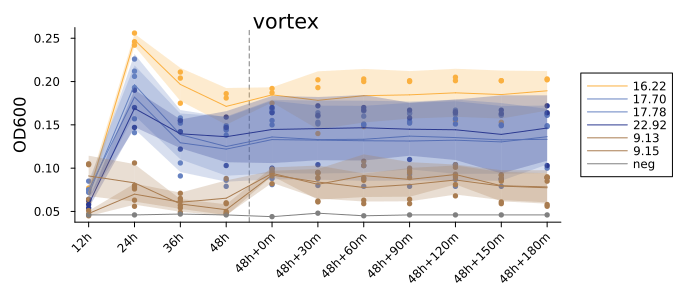

In [30]:
#| code-fold: true
#| code-summary: plot motility assay

earlydf = CSV.read(datadir("exp_raw", "OD600_motility", "earlygrowth_OD600.tsv"), DataFrame, delim="\t") |>
    df -> stack(df, 2:5) |>
    df -> rename(df, :variable => :time, :value => :OD600);
earlydf = earlydf |>
    df -> transform(df,
        :ID => (x->join.(first.(split.(x, "."), 2), ".")) => :msk_id,
        :ID => (x->last.(split.(x, "."))) => :replicate,
    );

vortexdf = CSV.read(datadir("exp_raw", "OD600_motility", "postvortex_OD600.tsv"), DataFrame, delim="\t") |>
    df -> stack(df, 2:8) |>
    df -> rename(df, :variable => :time, :value => :OD600);
vortexdf = vortexdf |>
    df -> transform(df,
        :ID => (x->join.(first.(split.(x, "."), 2), ".")) => :msk_id,
        :ID => (x->last.(split.(x, "."))) => :replicate,
    );
vortexpltdf = vortexdf |>
    df->groupby(df, [:time, :msk_id]) |>
    df->combine(df, 
        :OD600 => mean,
        :OD600 => std,
    );

fulldf = vcat(earlydf, vortexdf)
# fulldf = filter(:msk_id => x->startswith(x, r"(9|17|22|neg)"), fulldf)
fullpltdf = fulldf |>
    df->groupby(df, [:time, :msk_id]) |>
    df->combine(df, 
        :OD600 => mean,
        :OD600 => std,
    );
fullpltdf.OD600_std .= replace(fullpltdf.OD600_std, NaN => 0.); # set correct std for single negative control

cmap=Dict(
    "neg" => :grey,
    "9.13" => "#A97C50",
    "9.15" => "#A97C50",
    "16.22" => "#FBB040",
    "17.70" => "#6682C1",
    "17.78" => "#6682C1",
    "22.92" => "#2B3990"
)

plot(
    ylabel="OD600",
    legend=:outerright,
    xrotation=45,
    margin=5Plots.Measures.mm,
    size=(700,300),
    bottommargins=10Plots.mm,
)
@df fulldf scatter!(
    :time, :OD600,
    group=:ID, 
    c=[cmap[id] for id in :msk_id],
    label="", markersize=3, markerstrokewidth=0,
)
vline!([4], c=:black, lw=.5, linestyle=:dash)
@df fullpltdf plot!(
    :time, :OD600_mean,
    group=:msk_id, ribbon=:OD600_std,
    c=[cmap[id] for id in :msk_id],
    fillalpha=.25,
)
annotate!(4.8, .27, text("vortex"))

In [31]:
savefig(joinpath(pdir, "motility_experiment_plot.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/strain_variation_tree_and_tests/motility_experiment_plot.pdf"

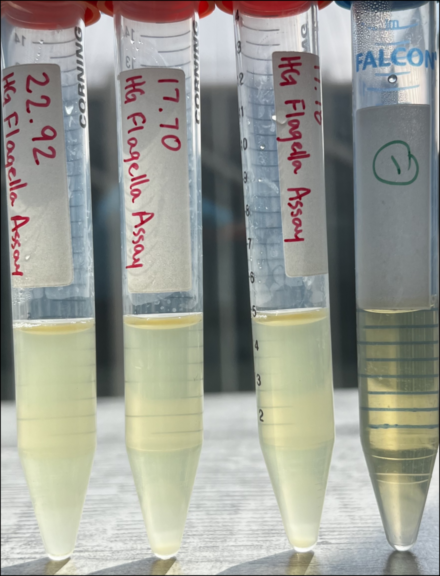

In [32]:
img = load(datadir("exp_raw", "OD600_motility", "swimmers_after24h.jpg"))
ysize = floor.(Int, quantile(1:size(img,1), [0.2, 0.77])) |> x->x[1]:x[2]
xsize = floor.(Int, quantile(1:size(img,2), [0.15, 0.73])) |> x->x[1]:x[2]
img[ysize, xsize]

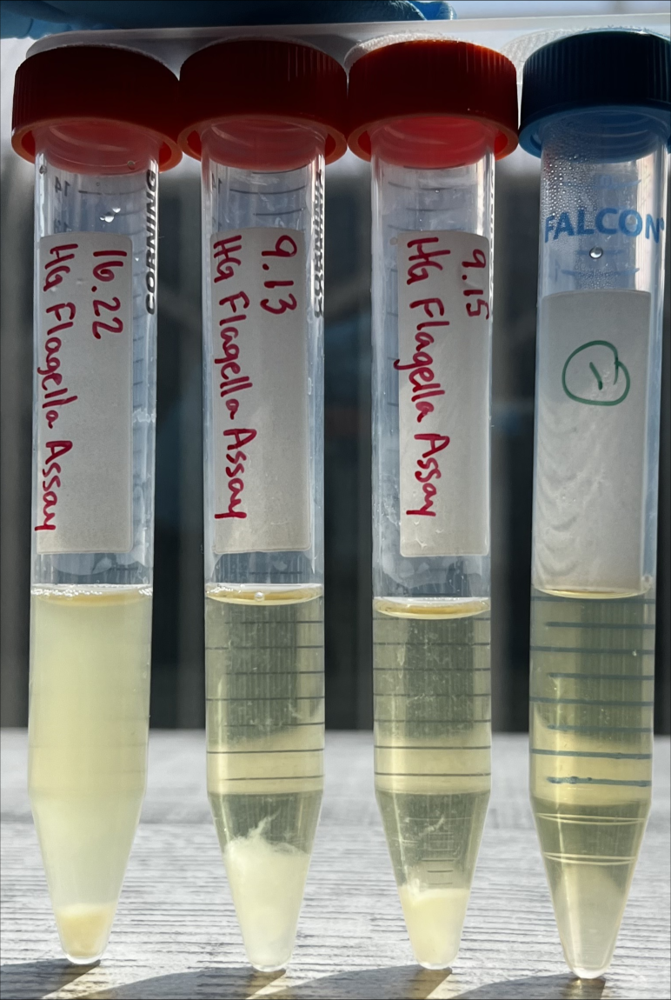

In [33]:
img = load(datadir("exp_raw", "OD600_motility", "nonswimmers_after24h.jpg"))
ysize = floor.(Int, quantile(1:size(img,1), [0.2, 0.77])) |> x->x[1]:x[2]
xsize = floor.(Int, quantile(1:size(img,2), [0.2, 0.71])) |> x->x[1]:x[2]
img[ysize, xsize]

## How conserved are these features?

The flagellum is generally highly conserved, it is remarkable that phage seemed to be involved with deleting such seemingly important machinery from the organism.

Thus, we examined the conservation pattern of the 12 annotated gene groups that were absent in E. rectale strains isolated from donors 9, 13, 16 but present in strains isolated from donors 17 and 22 across the entire Spectral Tree

In [34]:
uniprot = readh5ad(datadir("exp_raw", "UP7047", "2020_02_UP7047.h5ad"))
upmtx = uniprot.X[:,:];
uptree = readnw(readline(projectdir("_research", "UP7047_neighborjoined_spitree", "2020_02_UP7047-supporttree_50pct.nw")));
leafnodes = getleaves(uptree);
treeorder = indexin(getleafnames(uptree), uniprot.obs_names);

In [35]:
species_name = "rectale"
foundtaxa = uniprot.obs[contains.(uniprot.obs.Species, species_name), [:Kingdom, :Phylum, :Class, :Order, :Family, :Genus, :Species]]
@info "string: '$(species_name)' finds $(nrow(foundtaxa)) taxa:\n$(foundtaxa)"

┌ Info: string: 'rectale' finds 1 taxa:
│ 1×7 DataFrame
│  Row │ Kingdom   Phylum      Class       Order          Family           Genus   Species
│      │ String    String      String      String         String           String  String
│ ─────┼─────────────────────────────────────────────────────────────────────────────────────────────────
│    1 │ Bacteria  Firmicutes  Clostridia  Clostridiales  Lachnospiraceae          [Eubacterium] rectale
└ @ Main /Users/bend/projects/Doran_etal_2023/notebooks/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_Y101sZmlsZQ==.jl:3


In [36]:
test_oggs = subset(ogg_plotting_order,
    :description => ByRow(!=("")), # drop unannotated oggs
    :description => ByRow(!=("domain, Protein")), # drop unannotated oggs
    :log2FC => ByRow(<(0)), # drop oggs increased in the presence of phage
).ogg_name
uniprot.var[indexin(sort(test_oggs), uniprot.var_names), [:og, :description]]

Row,og,description
,String,String
1,COG0835,chemotaxis
2,COG0842,Transport permease protein
3,COG1344,bacterial-type flagellum-dependent cell motility
4,COG1345,"Required for morphogenesis and for the elongation of the flagellar filament by facilitating polymerization of the flagellin monomers at the tip of growing filament. Forms a capping structure, which prevents flagellin subunits (transported through the central channel of the flagellum) from leaking out without polymerization at the distal end"
5,COG1442,lipopolysaccharide 3-alpha-galactosyltransferase activity
6,COG1516,flagellar protein fliS
7,COG1776,chemotaxis
8,COG2186,Transcriptional regulator
9,COG2198,Histidine kinase


In [37]:
# oggs from E. rectale test that are in Uniprot
chosen_oggs_idx = indexin(test_oggs, uniprot.var_names);
# make presence/absence matix `subset_ogg_mtx`
subset_ogg_mtx = upmtx[:, chosen_oggs_idx] .> 0;
chosen_oggs = uniprot.var.og[chosen_oggs_idx]
@show chosen_oggs;

chosen_oggs = ["COG1345", "COG1344", "COG5444", "COG5001", "COG3547", "COG4495", "COG1442", "COG4786", "COG5279", "COG1776", "COG2944", "COG0842", "COG1516", "COG0835", "COG2186", "COG2198"]


In [38]:
# collect parent nodes back to pseudo-root of uniprot tree
species_node_idx = findall(contains.(uniprot.obs.Species[treeorder], species_name))[1]
speciesnode = leafnodes[species_node_idx]
depthofspecies = network_distance(uptree, speciesnode)
speciesparents = []
node = speciesnode
for i in 1:depthofspecies
    node = parent(node)
    push!(speciesparents, node)
end
cladesizes = length.(getleafnames.(speciesparents))
@info "# of taxa per clade = $(cladesizes)"

┌ Info: # of taxa per clade = [3, 10, 23, 101, 216, 265, 380, 600, 733, 1022, 1065, 2376, 6709, 7047]
└ @ Main /Users/bend/projects/Doran_etal_2023/notebooks/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_Y104sZmlsZQ==.jl:12


In [74]:
# only 1 E. rectale in uniprot
sum(==("Agathobacter"), uniprot.obs.Genus)

1

Local subtree of *E. rectale* in Uniprot tree

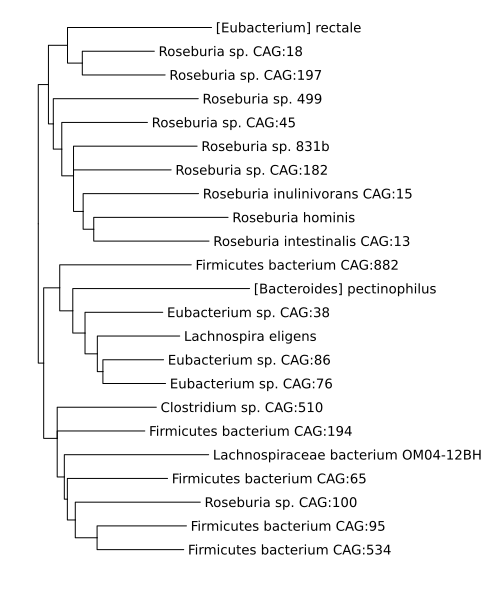

In [40]:
subset_tree = readnw(nwstr(speciesparents[3]))
for leaf in getleaves(subset_tree)
    NewickTree.setname!(leaf, only(uniprot.obs.Species[uniprot.obs.Proteome_ID .== name(leaf)]) )
end
plot(subset_tree, rightmargin=6Plots.cm, fs=9, size=(500,600))

Larger subtree of *E. rectale* in Uniprot tree

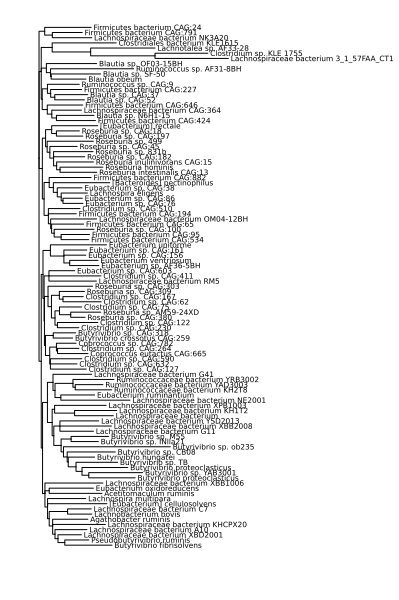

In [41]:
subset_tree = readnw(nwstr(speciesparents[4]))
for leaf in getleaves(subset_tree)
    NewickTree.setname!(leaf, only(uniprot.obs.Species[uniprot.obs.Proteome_ID .== name(leaf)]) )
end
plot(subset_tree, rightmargin=4Plots.cm, fs=5, size=(400,600))

In [42]:
bblsvs = projectinLSV(bbmtx, upusv);

In [43]:
rectale_mask = occursin.("rectale", biobank.obs.Species);

In [44]:
joined_dij = spectraldistances([upusv.U; bblsvs[rectale_mask, :]], upusv.S, alpha=1.5, q=0.75);

In [45]:
rectale_dij = joined_dij[(size(upusv.U,1)+1):end, 1:(end-sum(rectale_mask))]
rectale_upnns = first.(sortperm.(eachrow(rectale_dij)), 5);


In [46]:
hcat(biobank.obs[rectale_mask, [:Strain_ID, :NCBI_Species]],
    DataFrame(getindex.(Ref(uniprot.obs.Species), rectale_upnns) |> stack |> permutedims, [:nn_1, :nn_2, :nn_3, :nn_4, :nn_5]),
     DataFrame(;
    # uniprot_nearest_neighbor_Species=uniprot.obs.Species[rectale_upnns],
    # uniprot_nearest_neighbor_Phylum=uniprot.obs.Phylum[rectale_upnns],
    )
)

Row,Strain_ID,NCBI_Species,nn_1,nn_2,nn_3,nn_4,nn_5
,String,String,String,String,String,String,String
1,MSK.9.13,[Eubacterium] rectale,[Eubacterium] rectale,Aeromonas sp. w55,Photobacterium damselae,Cyanobacteria bacterium,Bacillus sp. UFRGS-B20
2,MSK.13.59,[Eubacterium] rectale,Photobacterium damselae,Cyanobacteria bacterium,[Eubacterium] rectale,Candidatus Nasuia deltocephalinicola,Aeromonas sp. w55
3,MSK.16.22,[Eubacterium] rectale,[Eubacterium] rectale,Cyanobacteria bacterium,Candidatus Vidania fulgoroideae,Candidatus Carsonella ruddii,Bacillus sp. UFRGS-B20
4,MSK.9.15,[Eubacterium] rectale,Aeromonas sp. w55,Photobacterium damselae,[Eubacterium] rectale,Cyanobacteria bacterium,Candidatus Tremblaya princeps
5,MSK.13.48,[Eubacterium] rectale,Photobacterium damselae,Cyanobacteria bacterium,[Eubacterium] rectale,Candidatus Vidania fulgoroideae,Candidatus Nasuia deltocephalinicola
6,MSK.13.50,[Eubacterium] rectale,Photobacterium damselae,Cyanobacteria bacterium,[Eubacterium] rectale,Candidatus Nasuia deltocephalinicola,Candidatus Vidania fulgoroideae
7,MSK.17.42,[Eubacterium] rectale,[Eubacterium] rectale,Roseburia sp. CAG:18,Photobacterium damselae,Cyanobacteria bacterium,Opitutae bacterium SCGC AG-212-L18
8,MSK.17.3,[Eubacterium] rectale,[Eubacterium] rectale,Roseburia sp. CAG:18,Photobacterium damselae,Cyanobacteria bacterium,Opitutae bacterium SCGC AG-212-L18
9,MSK.17.13,[Eubacterium] rectale,[Eubacterium] rectale,Roseburia sp. CAG:18,Photobacterium damselae,Cyanobacteria bacterium,Opitutae bacterium SCGC AG-212-L18


## Conservation of motility expanding out from E. rectale

In [75]:
# for each node find all children and measure percentage of children where 
# chosen oggs are present
cladesateachtreelevel = getleafnames.(speciesparents);
frac_present = map(cladesateachtreelevel) do clade_ids
    cladeidx = indexin(clade_ids, uniprot.obs_names)
    mean(subset_ogg_mtx[cladeidx, :], dims=1) |> vec
end |> stack

# check how many oggs (n=16) are fully conserved across the smallest clade (n=3)
islocallypresent = frac_present[:, 1] .== 1;
@info "# locally present = $(sum(islocallypresent)), # not locally present = $(sum(.!islocallypresent))"
numcols = length(cladesizes);

┌ Info: # locally present = 12, # not locally present = 4
└ @ Main /Users/bend/projects/Doran_etal_2023/notebooks/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_Y120sZmlsZQ==.jl:11


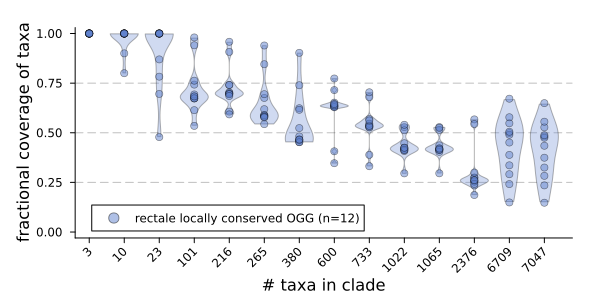

In [76]:
#| fig-cap: these results seemed to show that indeed the orthologs absent from phage-assoiated strains in E. rectale are present on over half of the 250 most closely related species. And, even across all bacteria, there at least 3 orthologs that are conserved across half of bacteria. 
# plot the locally present oggs up through the tree
plot(
    xticks=(1:numcols, string.(cladesizes)),
    xrotation=45,
    ylabel="fractional coverage of taxa",
    xlabel="# taxa in clade",
    margin=5Plots.Measures.mm,
    ylims=(0,1), widen=true,
    size=(600,300),
    yticks=0:.25:1,
    legend=:bottomleft,
)
hline!([.25, .5, .75], c=:grey, alpha=.5, linestyle=:dash)
violin!(permutedims(1:numcols), frac_present[islocallypresent, :], alpha=.3, c="#6182ce")
dotplot!(permutedims(1:numcols), frac_present[islocallypresent, :], c="#6182ce", alpha=.5, mode=:none, )
scatter!([NaN], label=permutedims(["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))"]), c=["#6182ce"], alpha=[0.5] )

## What phage related differences are present for other species?

Given the results in *E. rectale* we wanted to explore if these results were consistent across other species.

In [49]:
#| code-summary: function to plot sample oggs across distribution of oggs in uniprot
#| code-fold: true
function plot_conserved_oggs(species_title, chosen_oggs)
    chosen_oggs_idx = indexin(chosen_oggs, uniprot.var_names);
    coverage_uniprot = mean(upmtx .> 0, dims=1) |> vec
    sample_coverage = coverage_uniprot# [chosen_oggs_idx]
    sample_percentile = map(sample_coverage) do x 
        mean(coverage_uniprot .< x)
    end
    order = sortperm(sample_percentile)
    plot(
        title=species_title,
        xlabel="percentile",
        ylabel="fractional presence",
        lims=(0,1), 
        # widen=true, 
        ratio=1,
        grid=true,
        ticks=[0, .5, 1],
        tickdirection=:out,
        framestyle=:box,
    )


    plot!(sample_percentile[order], sample_coverage[order],
        c=:lightgrey, linewidth=4,
    )
    sample_coverage = coverage_uniprot[chosen_oggs_idx]
    sample_percentile = map(sample_coverage) do x 
        mean(coverage_uniprot .< x)
    end
    p1 = scatter!(sample_percentile, sample_coverage,
        alpha=.5,c="#6182ce", markersize=6,
    )
    margindensity = density(coverage_uniprot, 
        trim=true, fill=0, c=:yellow, linecolor=:black, permute=(:x, :y),
        ylabel="density",  yrotation=270, yticks=0:5:10,
        # xticks=false,
    )
    plot(p1, margindensity, layout = @layout([a{.9w} b]), size=(500,400), link=:y)
end

plot_conserved_oggs (generic function with 1 method)

In [50]:
#| code-summary: functions to extract strain ids and donor ids to each statistical test
#| code-fold: true
function getuniquedonors_fromtree(tree, target_id) 
    node = filter!(n -> id(n) == target_id, prewalk(tree))[1]
    grp1 = getleafnames(children(node)[1])
    doner_ids_1 = join(unique(replace.(grp1, r"\.\d+$"=>"")), ";")
    grp2 = getleafnames(children(node)[2])
    doner_ids_2 = join(unique(replace.(grp2, r"\.\d+$"=>"")), ";")
    doner_ids_1, doner_ids_2
end
function getuniquestrains_fromtree(tree, target_id) 
    node = filter!(n -> id(n) == target_id, prewalk(tree))[1]
    grp1 = getleafnames(children(node)[1])
    doner_ids_1 = join(grp1, ";")
    grp2 = getleafnames(children(node)[2])
    doner_ids_2 = join(grp2, ";")
    doner_ids_1, doner_ids_2
end

getuniquestrains_fromtree (generic function with 1 method)

In [51]:
strain_level_testresults = testresults |>
    df->subset(df, 
        :tree_level => ByRow(==("strain level")), 
        :log2FC => ByRow(x-> abs(x) > 1), 
        :qval_BH => ByRow(<(0.05)),
        ) |>
    df->leftjoin(df, uniprot.var[:, [:og, :description]], on = :ogg_name => :og) |>
    df->subset(df, :description => ByRow(x-> (!ismissing(x)) && (x!=("")))) |>
    df->select(df, :nodeids, :nodedepth, :grp1_species_mode => :species, :grp1_N, :grp2_N, :ogg_name,:ogg_freqs, :grp1_prp_exp, :grp2_prp_exp, :log2FC, :qval_BH, :description) |>
    df->groupby(df, :nodeids) |>
    df->transform(df, 
        :nodeids => ByRow(x -> getuniquedonors_fromtree(strvartree, x)) => [:grp1_donor_ids, :grp2_donor_ids],
        :nodeids => ByRow(x -> getuniquestrains_fromtree(strvartree, x)) => [:grp1_strain_ids, :grp2_strain_ids],
    ) |>
    df->sort(df, [:nodeids, :log2FC])
first(strain_level_testresults, 5)

Row,nodeids,nodedepth,species,grp1_N,grp2_N,ogg_name,ogg_freqs,grp1_prp_exp,grp2_prp_exp,log2FC,qval_BH,description,grp1_donor_ids,grp2_donor_ids,grp1_strain_ids,grp2_strain_ids
,Int64,Float64,String31,Int64,Int64,String15,Float64,Float64,Float64,Float64,Float64,String?,String,String,String,String
1,4,1.59622,Bacteroides uniformis,4,23,COG1115,0.924157,0.25,1.0,-1.3891,0.0,amino acid carrier protein,DFI.1;MSK.17,MSK.19;MSK.20;MSK.16;DFI.3;MSK.18;DFI.4,DFI.1.247;DFI.1.135;DFI.1.173;MSK.17.15,MSK.19.71;MSK.19.54;MSK.19.4;MSK.19.91;MSK.19.84;MSK.20.30;MSK.20.3;MSK.20.79;MSK.16.71;MSK.16.7;MSK.16.46;MSK.16.44;MSK.16.39;DFI.3.57;MSK.18.66;MSK.18.33;MSK.18.78;MSK.18.89;MSK.18.30;MSK.18.25;MSK.18.77;MSK.18.74;DFI.4.149
2,4,1.59622,Bacteroides uniformis,4,23,COG0639,0.266854,0.25,0.956522,-1.26605,0.0,phosphoprotein phosphatase activity,DFI.1;MSK.17,MSK.19;MSK.20;MSK.16;DFI.3;MSK.18;DFI.4,DFI.1.247;DFI.1.135;DFI.1.173;MSK.17.15,MSK.19.71;MSK.19.54;MSK.19.4;MSK.19.91;MSK.19.84;MSK.20.30;MSK.20.3;MSK.20.79;MSK.16.71;MSK.16.7;MSK.16.46;MSK.16.44;MSK.16.39;DFI.3.57;MSK.18.66;MSK.18.33;MSK.18.78;MSK.18.89;MSK.18.30;MSK.18.25;MSK.18.77;MSK.18.74;DFI.4.149
3,4,1.59622,Bacteroides uniformis,4,23,COG3958,0.842697,0.0,1.0,-1.12717,0.0,transketolase activity,DFI.1;MSK.17,MSK.19;MSK.20;MSK.16;DFI.3;MSK.18;DFI.4,DFI.1.247;DFI.1.135;DFI.1.173;MSK.17.15,MSK.19.71;MSK.19.54;MSK.19.4;MSK.19.91;MSK.19.84;MSK.20.30;MSK.20.3;MSK.20.79;MSK.16.71;MSK.16.7;MSK.16.46;MSK.16.44;MSK.16.39;DFI.3.57;MSK.18.66;MSK.18.33;MSK.18.78;MSK.18.89;MSK.18.30;MSK.18.25;MSK.18.77;MSK.18.74;DFI.4.149
4,4,1.59622,Bacteroides uniformis,4,23,COG3959,0.842697,0.0,1.0,-1.12717,0.0,transketolase activity,DFI.1;MSK.17,MSK.19;MSK.20;MSK.16;DFI.3;MSK.18;DFI.4,DFI.1.247;DFI.1.135;DFI.1.173;MSK.17.15,MSK.19.71;MSK.19.54;MSK.19.4;MSK.19.91;MSK.19.84;MSK.20.30;MSK.20.3;MSK.20.79;MSK.16.71;MSK.16.7;MSK.16.46;MSK.16.44;MSK.16.39;DFI.3.57;MSK.18.66;MSK.18.33;MSK.18.78;MSK.18.89;MSK.18.30;MSK.18.25;MSK.18.77;MSK.18.74;DFI.4.149
5,4,1.59622,Bacteroides uniformis,4,23,COG1226,0.241573,1.0,1.0,-1.06998,0.0,(belongs to the monovalent cation proton antiporter 2 (CPA2) transporter (TC 2.A.37) family),DFI.1;MSK.17,MSK.19;MSK.20;MSK.16;DFI.3;MSK.18;DFI.4,DFI.1.247;DFI.1.135;DFI.1.173;MSK.17.15,MSK.19.71;MSK.19.54;MSK.19.4;MSK.19.91;MSK.19.84;MSK.20.30;MSK.20.3;MSK.20.79;MSK.16.71;MSK.16.7;MSK.16.46;MSK.16.44;MSK.16.39;DFI.3.57;MSK.18.66;MSK.18.33;MSK.18.78;MSK.18.89;MSK.18.30;MSK.18.25;MSK.18.77;MSK.18.74;DFI.4.149


In [52]:
CSV.write(joinpath(rdir, "strain_level_testresults_with_annotations.tsv"), strain_level_testresults; delim="\t")

"/Users/bend/projects/Doran_etal_2023/_research/strain_variation_wilcoxon_tests/strain_level_testresults_with_annotations.tsv"

In [53]:
#| code-summary: strain-level test results where ogg is only shown if was not found elsewhere
#| code-fold: true
uniqueOGGresults |>
    df->subset(df, 
        :tree_level => ByRow(==("strain level")), 
        :log2FC => ByRow(x-> abs(x) > 1), 
        :qval_BH => ByRow(<(0.05)),
        ) |>
    df->leftjoin(df, uniprot.var[:, [:og, :description]], on = :ogg_name => :og) |>
    df->subset(df, :description => ByRow(x-> (!ismissing(x)) && (x!=("")))) |>
    df->select(df, :nodeids, :nodedepth, :grp1_species_mode => :species, :grp1_N, :grp2_N, :ogg_name,:ogg_freqs, :grp1_prp_exp, :grp2_prp_exp, :log2FC, :qval_BH, :description) |>
    df->groupby(df, :nodeids) |>
    df->transform(df, 
        :nodeids => ByRow(x -> getuniquedonors_fromtree(strvartree, x)) => [:grp1_donor_ids, :grp2_donor_ids],
        :nodeids => ByRow(x -> getuniquestrains_fromtree(strvartree, x)) => [:grp1_strain_ids, :grp2_strain_ids],
    ) |>
    df->sort(df, [:nodeids, :log2FC]) |>
    df->CSV.write(joinpath(rdir, "uniqueOGGresults_strainlevel_testresults.tsv"), df; delim="\t")

"/Users/bend/projects/Doran_etal_2023/_research/strain_variation_wilcoxon_tests/uniqueOGGresults_strainlevel_testresults.tsv"

Exploring these tables of test results revealed other instances of phage related strain level differences. For *P. vulgatus*, *M. gnavus*, *B. thetaiotaomicron*, and *C. comes* we found cases where OGGs associated with phage infection where more abundant in multiple strains in contrast to other "phage suppressed OGGs". We found no specificity in degree of conservation for these phage suppressed OGGs, highly conserved OGGs were just as likely to be suppressed as OGGs only found in a small number of taxa across all of UniProt.

### P. vulgatus

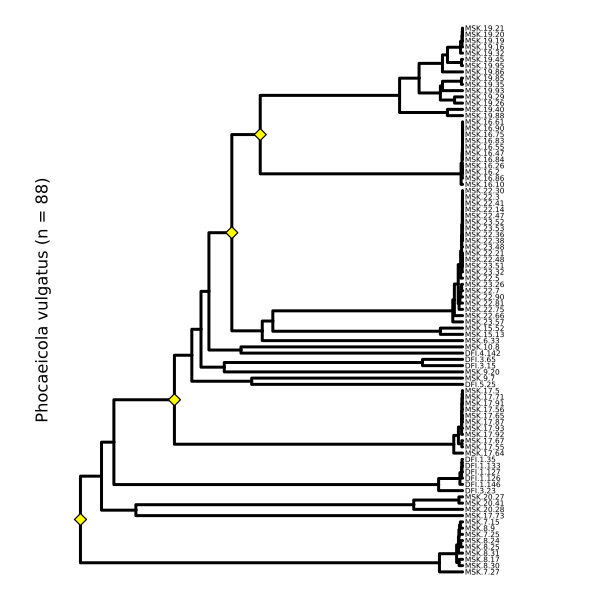

In [54]:
species_title = "Phocaeicola vulgatus"
targetid = "DFI.3.23"
strvar_leaves = getleaves(strvartree)
basenode = strvar_leaves[findfirst(n->name(n) == targetid, strvar_leaves)]
subtree = readnw(nwstr(nthparent(basenode, 4)))
ladderize!(subtree)
# tiplabels = join.(eachrow(strvarobs[indexin(getleafnames(subtree), strvarobs.Strain_ID), [:Strain_ID, :NCBI_Species]]), " ")
# idmapping = Dict(k=>v for (k,v) in zip(getleafnames(subtree), tiplabels))
# rename_treeleaves!(subtree, idmapping)

plot(subtree,
    c=:black,
    lw=3, fs=5,
    size=(600,600),
    rightmargin=3Plots.cm,
    leftmargin=10Plots.mm,
    ylabel=species_title * " (n = $(length(getleaves(subtree))))",
    framestyle=:grid,
    ticks=false,
)

# find and plot test nodes in subtree
leaves_of_test_nodes = map(prewalk(nthparent(basenode, 4))) do node; test_nodes=unique(strain_level_testresults.nodeids)
    if (Int(id(node)) ∈ test_nodes) && minimum(length.(getleaves.(children(node)))) > 6
        join(sort(getleafnames(node)), ";")
    else
        nothing
    end
end |> x->filter(!isnothing, x)
subtreepos = NewickTree.treepositions(subtree)
testnode_positions = map(keys(subtreepos), values(subtreepos)) do k,v
    x, y = v
    label = join(sort(getleafnames(k)), ";")
    if label ∈ leaves_of_test_nodes
        (; x, y, label)
    else
        nothing
    end
end |> x->filter(!isnothing, x)
@df DataFrame(testnode_positions) scatter!(:x, :y, markersize=6, c=:yellow, markershape=:diamond)


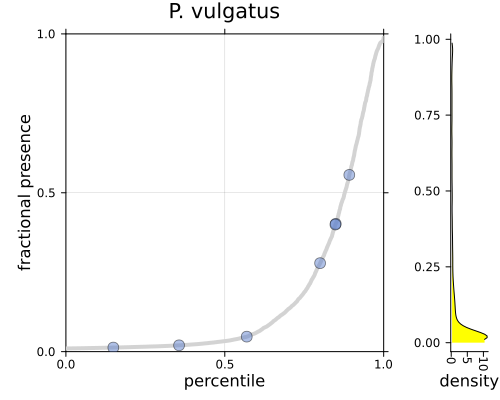

In [55]:
# collected by manually searching through strain-level test results
notable_oggs = ["COG0863","COG1083","COG4744", "32ZV1", "COG0666","COG2214","2Z8QV"]
plot_conserved_oggs("P. vulgatus", notable_oggs) 

### M. gnavus

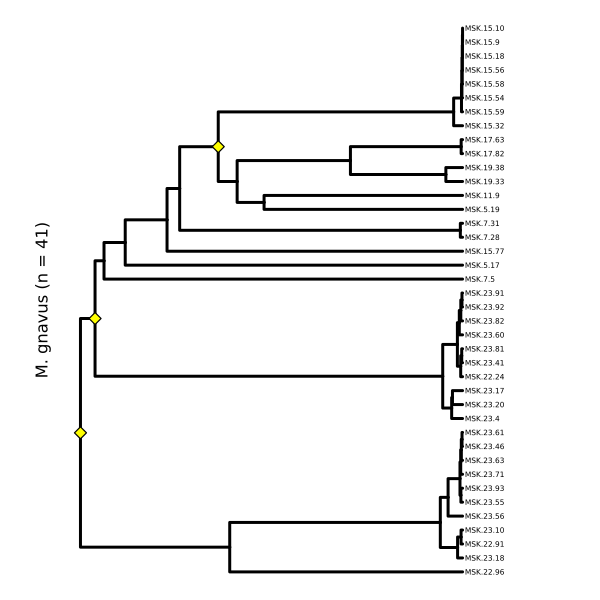

In [56]:
species_title = "[Ruminococcus] gnavus"
targetid = "MSK.22.91"
strvar_leaves = getleaves(strvartree)
basenode = strvar_leaves[findfirst(n->name(n) == targetid, strvar_leaves)]
subtreeroot = nthparent(basenode, 5)
subtree = readnw(nwstr(subtreeroot))
ladderize!(subtree)
# tiplabels = join.(eachrow(strvarobs[indexin(getleafnames(subtree), strvarobs.Strain_ID), [:Strain_ID, :NCBI_Species]]), " ")
# idmapping = Dict(k=>v for (k,v) in zip(getleafnames(subtree), tiplabels))
# rename_treeleaves!(subtree, idmapping)

plot(subtree,
    c=:black,
    lw=3, fs=5,
    size=(600,600),
    rightmargin=3Plots.cm,
    leftmargin=10Plots.mm,
    ylabel="M. gnavus (n = 41)",
    framestyle=:grid,
    ticks=false,
)

# find and plot test nodes in subtree
leaves_of_test_nodes = map(prewalk(subtreeroot)) do node; test_nodes=unique(strain_level_testresults.nodeids)
    if (Int(id(node)) ∈ test_nodes) && minimum(length.(getleaves.(children(node)))) >= 4
        join(sort(getleafnames(node)), ";")
    else
        nothing
    end
end |> x->filter(!isnothing, x)
subtreepos = NewickTree.treepositions(subtree)
testnode_positions = map(keys(subtreepos), values(subtreepos)) do k,v
    x, y = v
    label = join(sort(getleafnames(k)), ";")
    if label ∈ leaves_of_test_nodes
        (; x, y, label)
    else
        nothing
    end
end |> x->filter(!isnothing, x)
@df DataFrame(testnode_positions) scatter!(:x, :y, markersize=6, c=:yellow, markershape=:diamond)


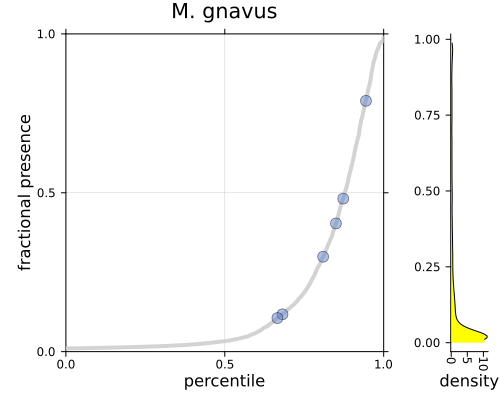

In [57]:
# collected by manually searching through strain-level test results
notable_oggs =     ["COG1440","COG1447","COG1694", "COG0531","COG1501","COG2222"]
plot_conserved_oggs("M. gnavus", notable_oggs) 

### B. thetaiotaomicron

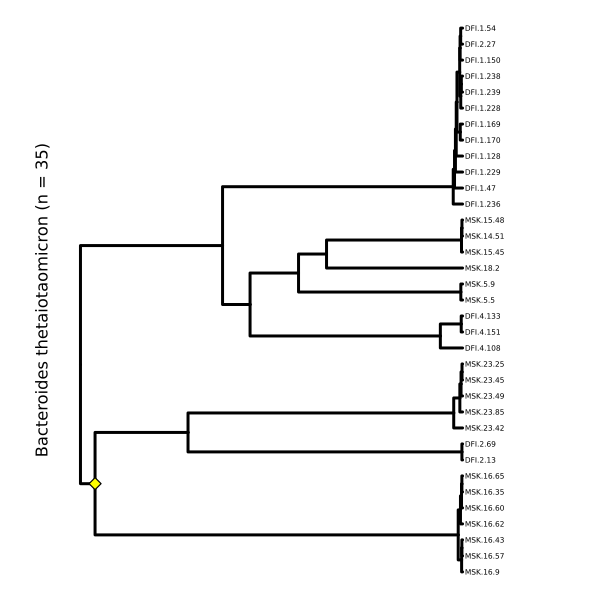

In [77]:
species_title = "Bacteroides thetaiotaomicron"
targetid = "DFI.4.108"
strvar_leaves = getleaves(strvartree)
basenode = strvar_leaves[findfirst(n->name(n) == targetid, strvar_leaves)]
subtreeroot = nthparent(basenode, 4)
subtree = readnw(nwstr(subtreeroot))
ladderize!(subtree)
# tiplabels = join.(eachrow(strvarobs[indexin(getleafnames(subtree), strvarobs.Strain_ID), [:Strain_ID, :NCBI_Species]]), " ")
# idmapping = Dict(k=>v for (k,v) in zip(getleafnames(subtree), tiplabels))
# rename_treeleaves!(subtree, idmapping)

plot(subtree,
    c=:black,
    lw=3, fs=5,
    size=(600,600),
    rightmargin=3Plots.cm,
    leftmargin=10Plots.mm,
    ylabel=species_title * " (n = $(length(getleaves(subtree))))",
    framestyle=:grid,
    ticks=false,
)

# find and plot phage related test nodes in subtree
leaves_of_test_nodes = map(prewalk(subtreeroot)) do node; test_nodes=unique(strain_level_testresults.nodeids)
    if (Int(id(node)) ∈ test_nodes) && minimum(length.(getleaves.(children(node)))) == 7
        join(sort(getleafnames(node)), ";")
    else
        nothing
    end
end |> x->filter(!isnothing, x)
subtreepos = NewickTree.treepositions(subtree)
testnode_positions = map(keys(subtreepos), values(subtreepos)) do k,v
    x, y = v
    label = join(sort(getleafnames(k)), ";")
    if label ∈ leaves_of_test_nodes
        (; x, y, label)
    else
        nothing
    end
end |> x->filter(!isnothing, x)
@df DataFrame(testnode_positions) scatter!(:x, :y, markersize=6, c=:yellow, markershape=:diamond)


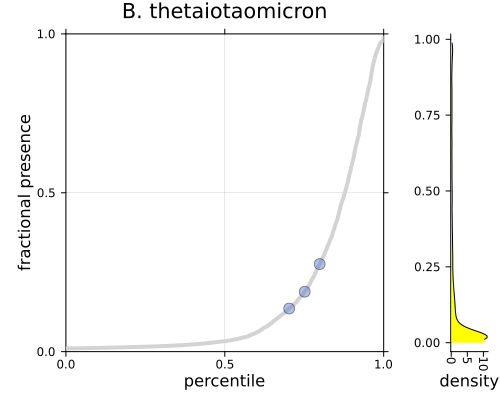

In [78]:
# collected by manually searching through strain-level test results
notable_oggs = ["COG1474","COG2942","COG3410"]
plot_conserved_oggs("B. thetaiotaomicron", notable_oggs)

### C. comes

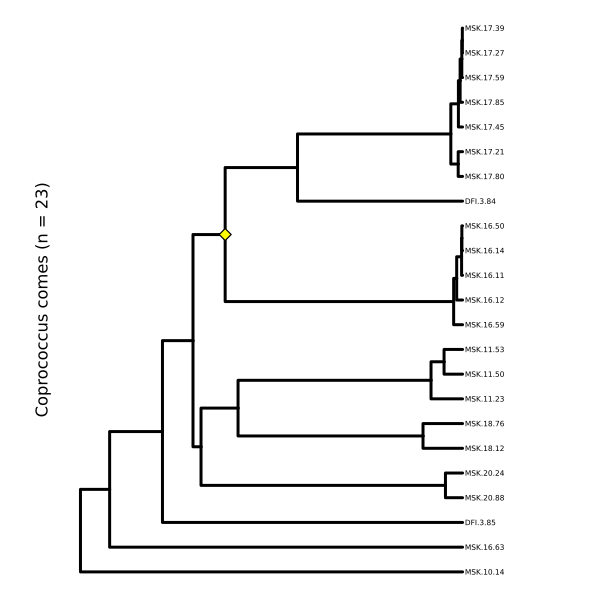

In [79]:
species_title = "Coprococcus comes"
targetid = "MSK.20.88"
strvar_leaves = getleaves(strvartree)
basenode = strvar_leaves[findfirst(n->name(n) == targetid, strvar_leaves)]
subtreeroot = nthparent(basenode, 6)
subtree = readnw(nwstr(subtreeroot))
ladderize!(subtree)
# tiplabels = join.(eachrow(strvarobs[indexin(getleafnames(subtree), strvarobs.Strain_ID), [:Strain_ID, :NCBI_Species]]), " ")
# idmapping = Dict(k=>v for (k,v) in zip(getleafnames(subtree), tiplabels))
# rename_treeleaves!(subtree, idmapping)

plot(subtree,
    c=:black,
    lw=3, fs=5,
    size=(600,600),
    rightmargin=3Plots.cm,
    leftmargin=10Plots.mm,
    ylabel=species_title * " (n = $(length(getleaves(subtree))))",
    framestyle=:grid,
    ticks=false,
)

# find and plot phage related test nodes in subtree
leaves_of_test_nodes = map(prewalk(subtreeroot)) do node; test_nodes=unique(strain_level_testresults.nodeids)
    if (Int(id(node)) ∈ test_nodes) && minimum(length.(getleaves.(children(node)))) ==5
        join(sort(getleafnames(node)), ";")
    else
        nothing
    end
end |> x->filter(!isnothing, x)
subtreepos = NewickTree.treepositions(subtree)
testnode_positions = map(keys(subtreepos), values(subtreepos)) do k,v
    x, y = v
    label = join(sort(getleafnames(k)), ";")
    if label ∈ leaves_of_test_nodes
        (; x, y, label)
    else
        nothing
    end
end |> x->filter(!isnothing, x)
@df DataFrame(testnode_positions) scatter!(:x, :y, markersize=6, c=:yellow, markershape=:diamond)


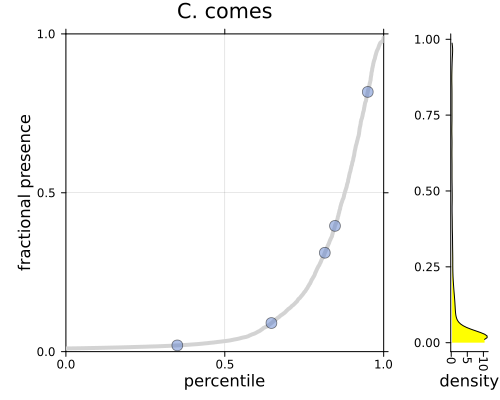

In [80]:
# collected by manually searching through strain-level test results
notable_oggs = ["COG0145","COG1011","COG1351","COG4951","2Z81G",]
plot_conserved_oggs("C. comes", notable_oggs)